# Filtering


In [ ]:
import warnings
warnings.filterwarnings('ignore')
import cv2
import numpy as np
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib','inline')

def show_img(image, plt_size):
    fig = plt.figure(figsize=(plt_size,plt_size))
    ax = fig.add_subplot(111)
    ax.imshow(image)
def load_img(path):
    img = cv2.imread(path).astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img
def gen_img():
    blank_img = np.zeros((400,600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img, text='ABCDF', org=(50, 300), fontFace=font, fontScale=5, color=(255,255,255), thickness=25)
    return blank_img
def show_img_gray(image, plt_size):
    fig = plt.figure(figsize=(plt_size,plt_size))
    ax = fig.add_subplot(111)
    ax.imshow(image, cmap='gray')

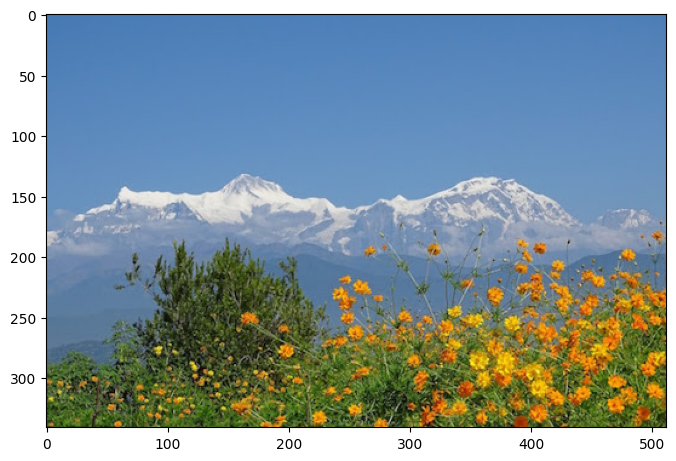

In [54]:
img = load_img('../images/himalayas.jpg')
show_img(img, 8)


In [4]:
[ih, iw, ic] = img.shape
rand_arr = np.random.randint(0, 50, (ih, iw, ic))
noise_arr = (rand_arr/255).astype(np.float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1921569].


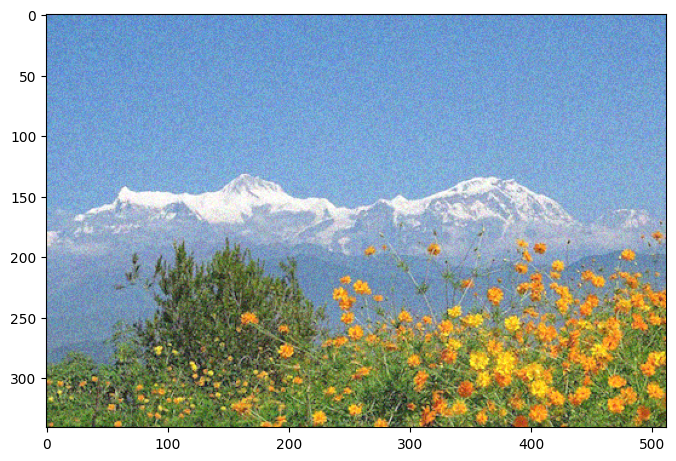

In [6]:
noisy_img = cv2.addWeighted(src1=img, alpha=1.0, src2=noise_arr, beta=1.0, gamma=0)
show_img(noisy_img, 8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.078431375..1.0705882].


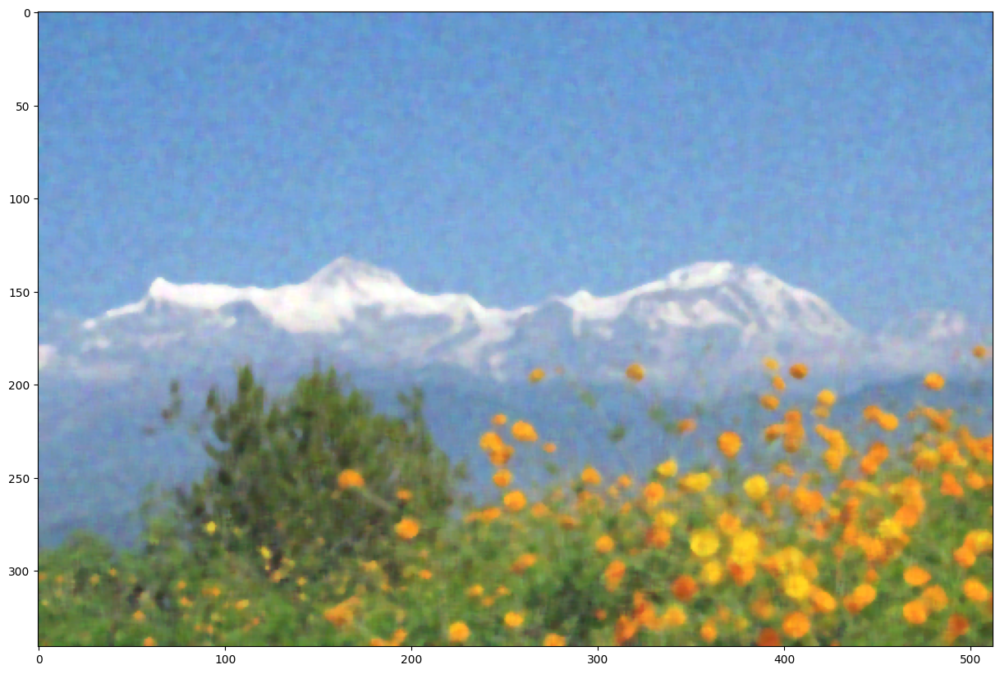

In [7]:
smooty = cv2.medianBlur(src=noisy_img, ksize=5)
show_img(smooty, 15)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07842999..1.0784563].


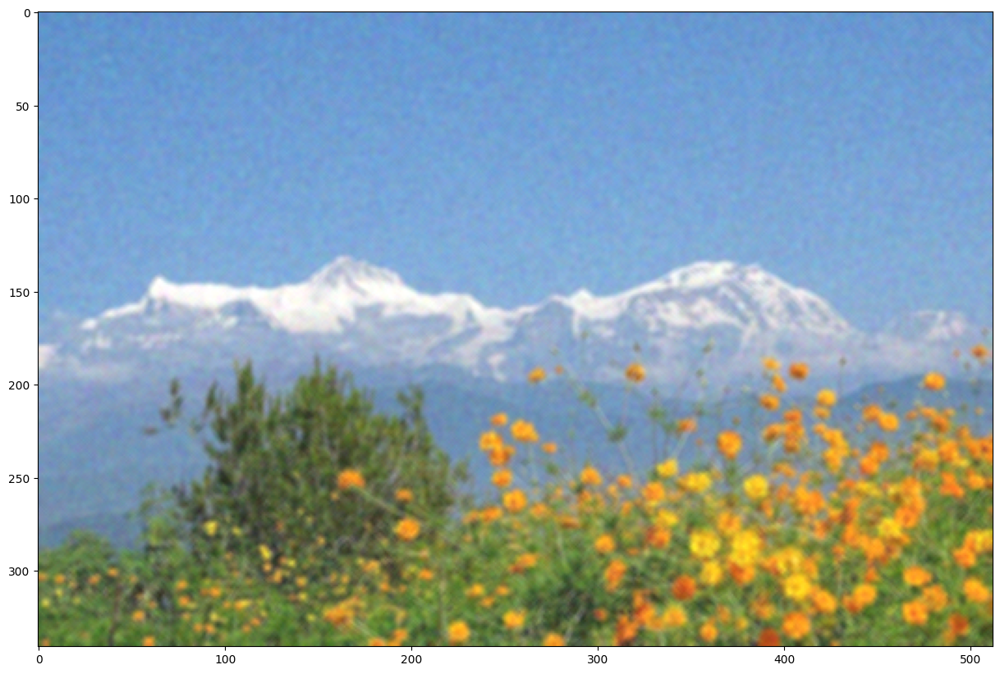

In [8]:
smooty1 = cv2.bilateralFilter(src=noisy_img, d=5, sigmaColor=15, sigmaSpace=15)
show_img(smooty1, 15)

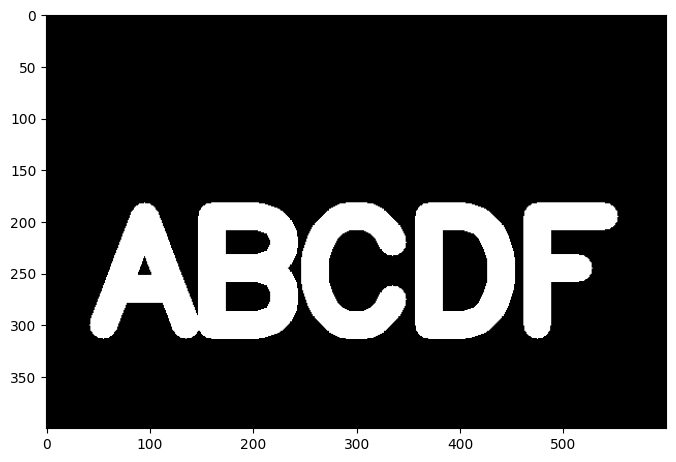

In [59]:
blank = gen_img()     
show_img_gray(blank, 8)


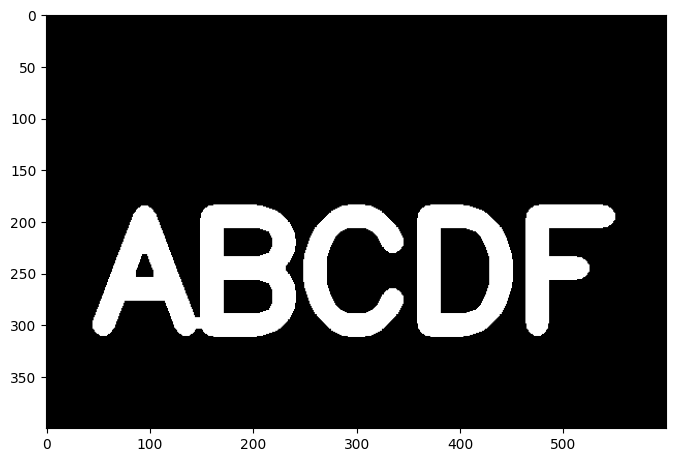

In [61]:
kernel = np.ones((5,5), dtype=np.uint8)
erode_img = cv2.erode(src=blank, kernel=kernel)
show_img_gray(erode_img, 8)

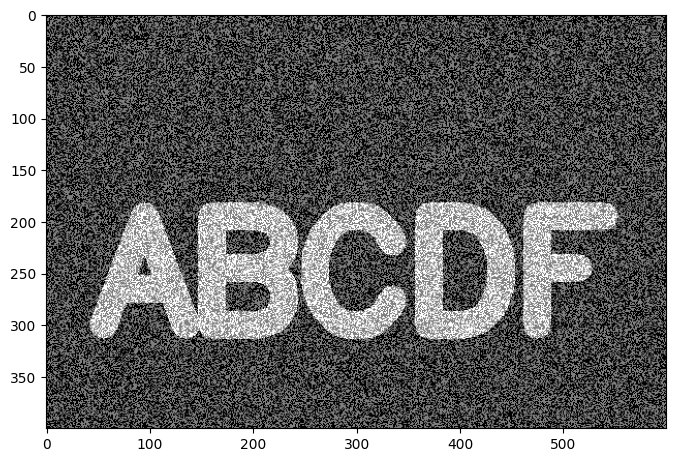

In [62]:
white_noise = np.random.randint(0, 2, size=(400,600))
white_noise = white_noise*255

w_noisy = white_noise + blank
show_img_gray(w_noisy, 8)


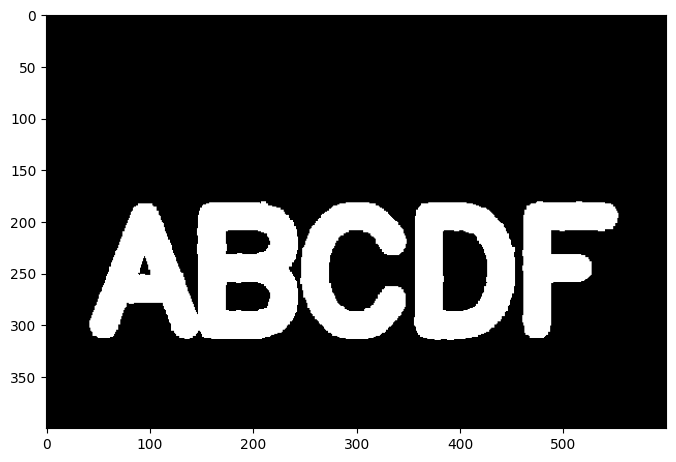

In [69]:
# delate = cv2.morphologyEx(w_noisy, cv2.MORPH_DILATE, kernel)
# show_img_gray(delate, 8)
opening = cv2.morphologyEx(w_noisy, cv2.MORPH_OPEN, kernel)
show_img_gray(opening, 8)

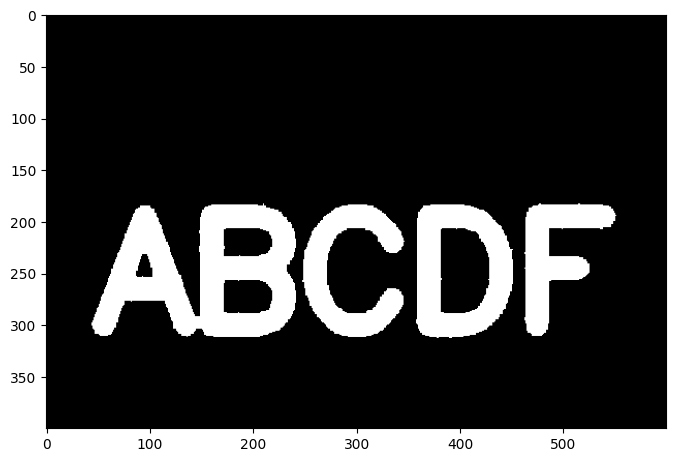

In [70]:
erode = cv2.morphologyEx(w_noisy, cv2.MORPH_ERODE, kernel)
show_img_gray(erode, 8)


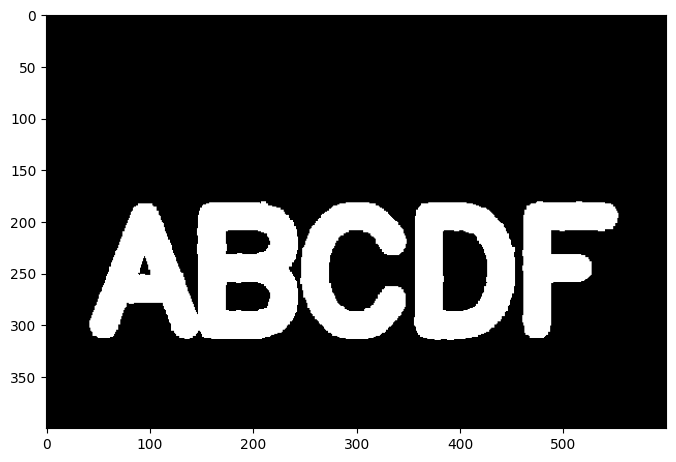

In [71]:
pening = cv2.morphologyEx(w_noisy, cv2.MORPH_OPEN, kernel)
show_img_gray(opening, 8)


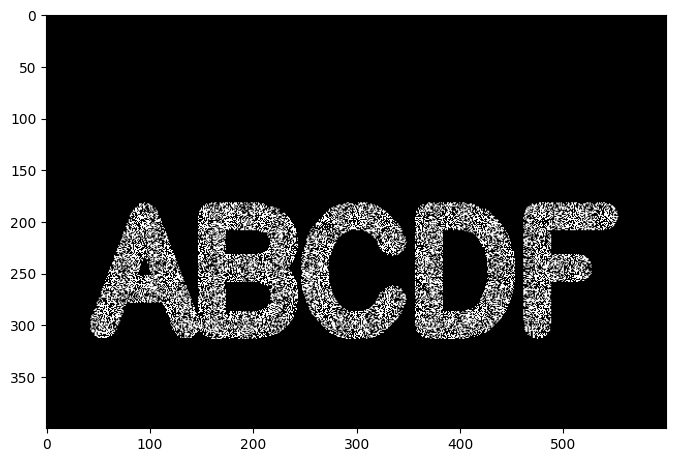

In [72]:
black_noise = np.random.randint(0,2, size=(400,600))
black_noise = black_noise*-255;
# show_img_gray(white_noise, 8)
b_noisy = blank + black_noise
b_noisy[ b_noisy == -255 ] = 0
show_img_gray(b_noisy, 8)

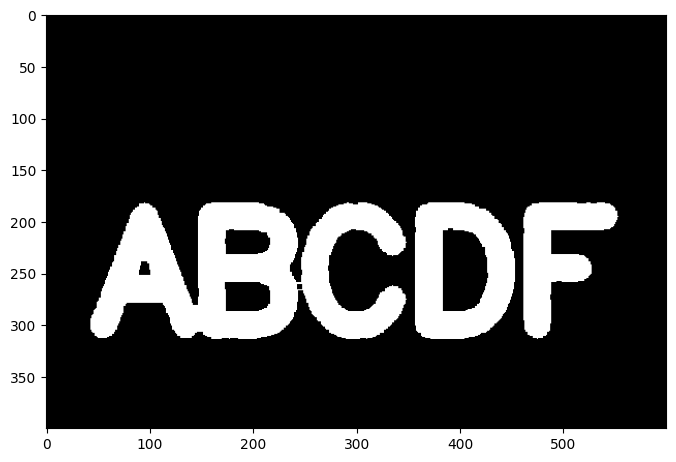

In [73]:
rm_b_noise = cv2.morphologyEx(b_noisy, cv2.MORPH_CLOSE, kernel )
show_img_gray(rm_b_noise, 8)


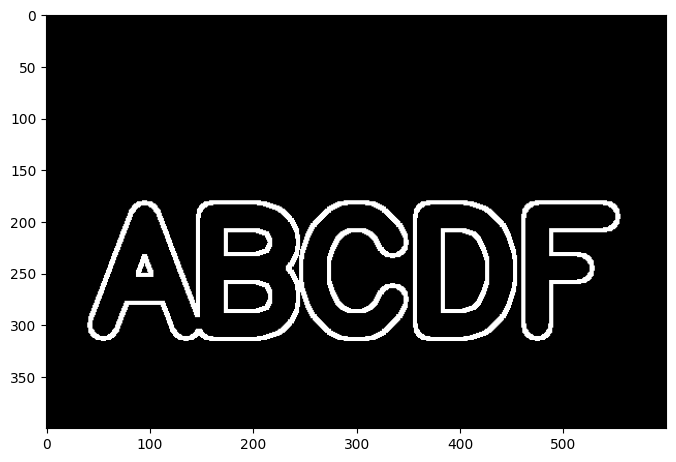

In [74]:
gradient = cv2.morphologyEx(blank, cv2.MORPH_GRADIENT, kernel)
show_img_gray(gradient, 8)

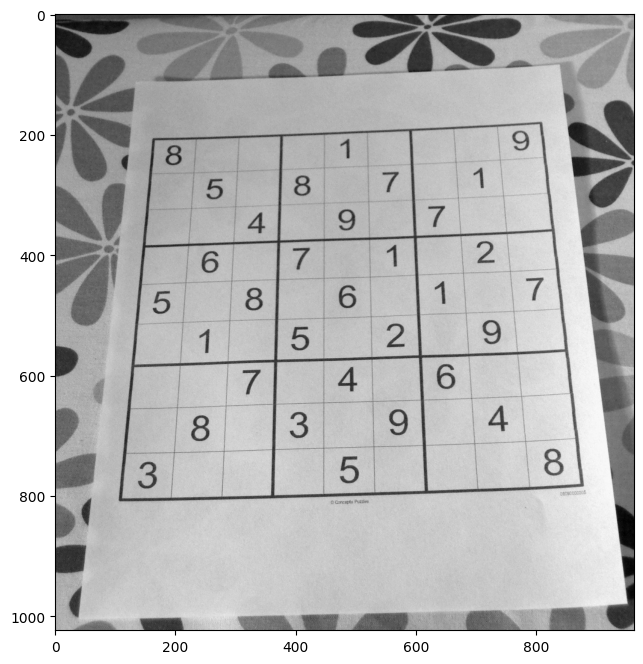

In [81]:
sudoku = cv2.imread('../images/sudoku.jpg', 0)
show_img_gray(sudoku, 8)

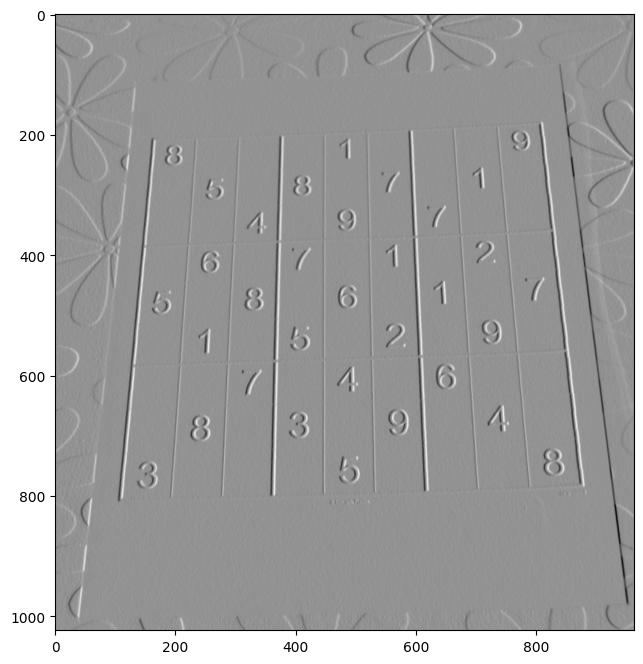

In [85]:
sobely = cv2.Sobel(sudoku, cv2.CV_64F, 1, 0, ksize = 5)
show_img_gray(sobely, 8)

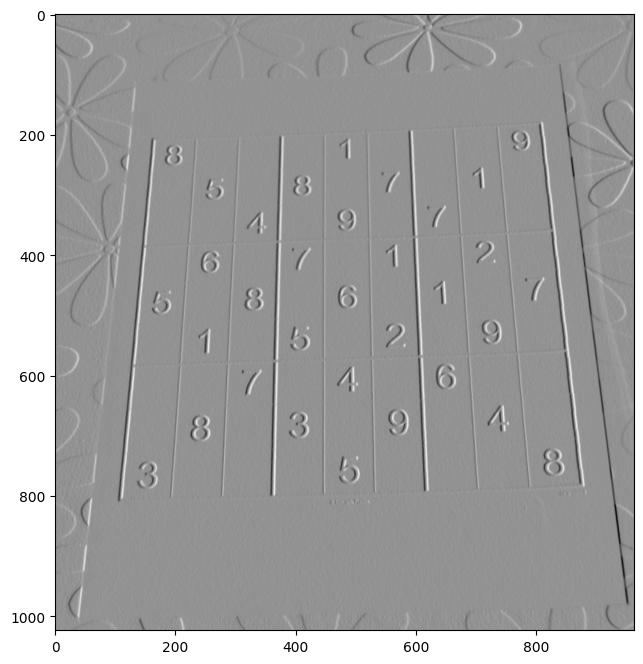

In [86]:
sobelxy = cv2.addWeighted(sobelx, 0.5, sobely, 0.5, gamma=0)
show_img_gray(sobelxy, 8)

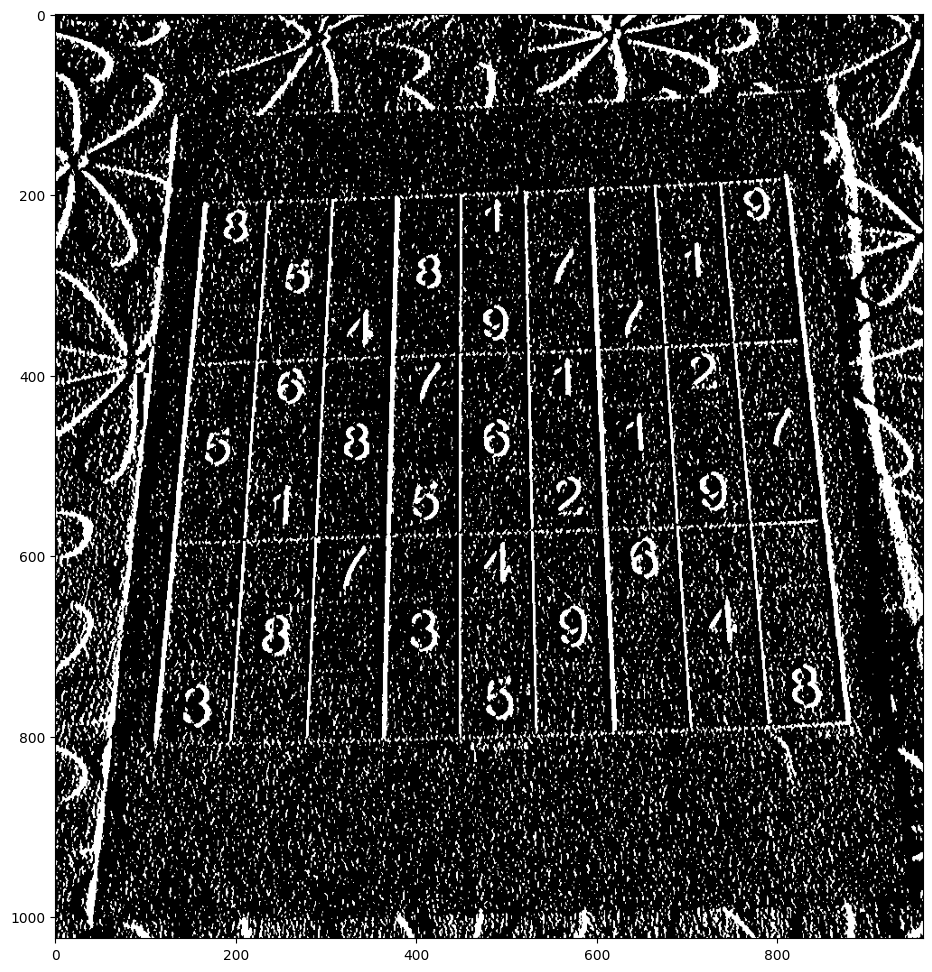

In [87]:
ret, th_img = cv2.threshold(sobelxy, 150, 255, cv2.THRESH_BINARY)
show_img_gray(th_img, 12)


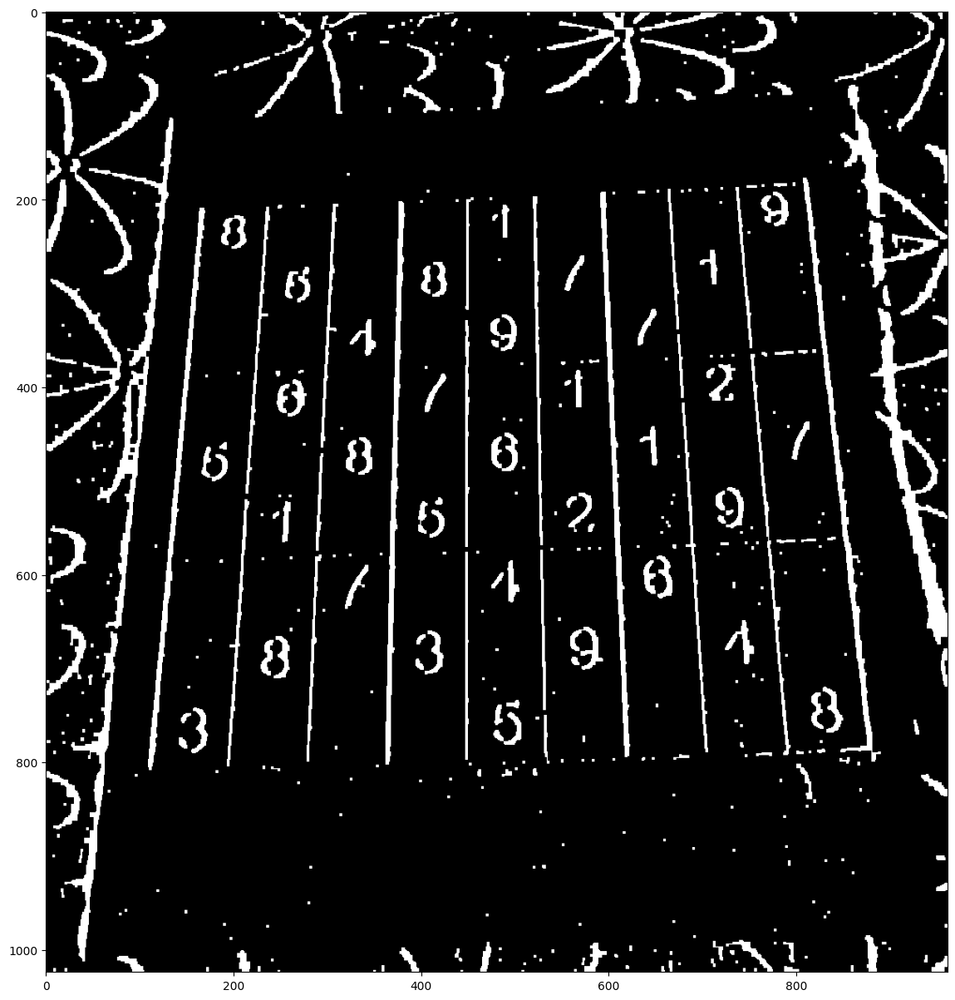

In [88]:
kernel3 = np.ones((3,3), dtype=np.uint8)
sudok_bw = cv2.morphologyEx(th_img, cv2.MORPH_OPEN, kernel3)
sudok_bw1 = cv2.morphologyEx(sudok_bw, cv2.MORPH_CLOSE, kernel)
show_img_gray(sudok_bw1, 15 )

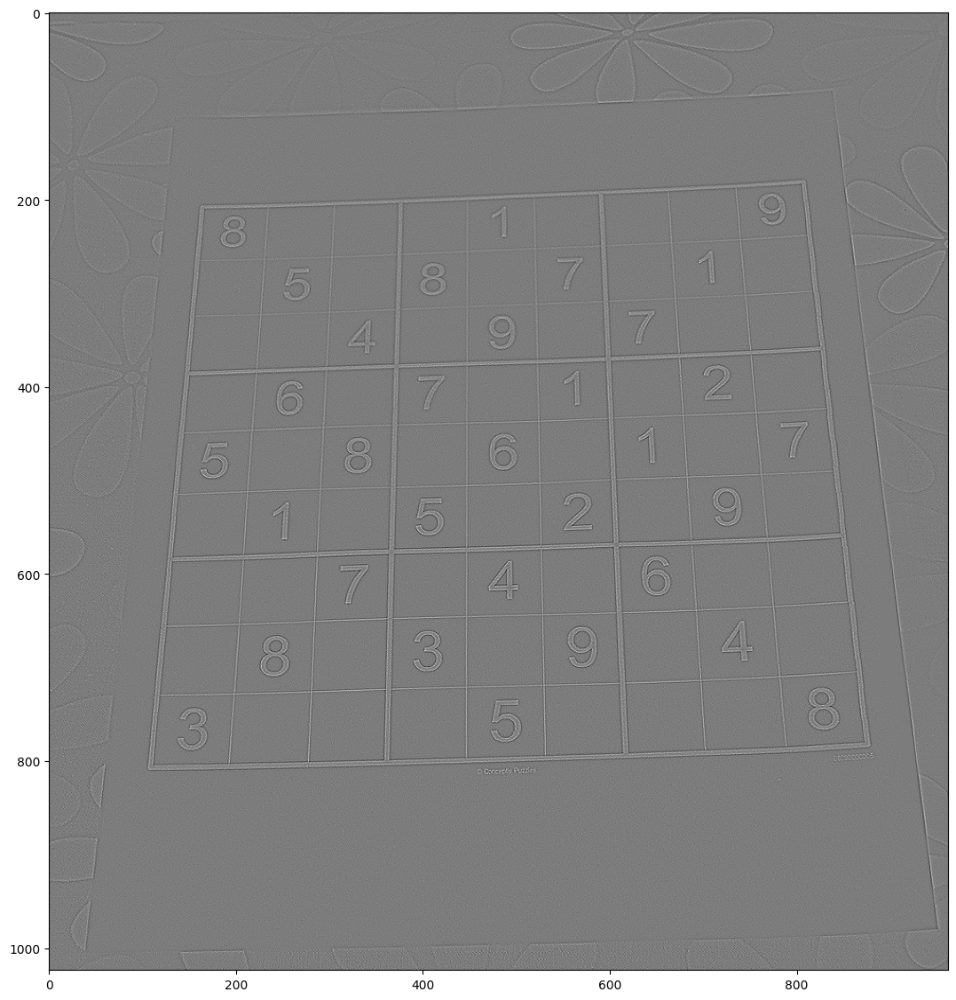

In [89]:
laplacian = cv2.Laplacian(sudoku, cv2.CV_64F)
show_img_gray(laplacian, 14)


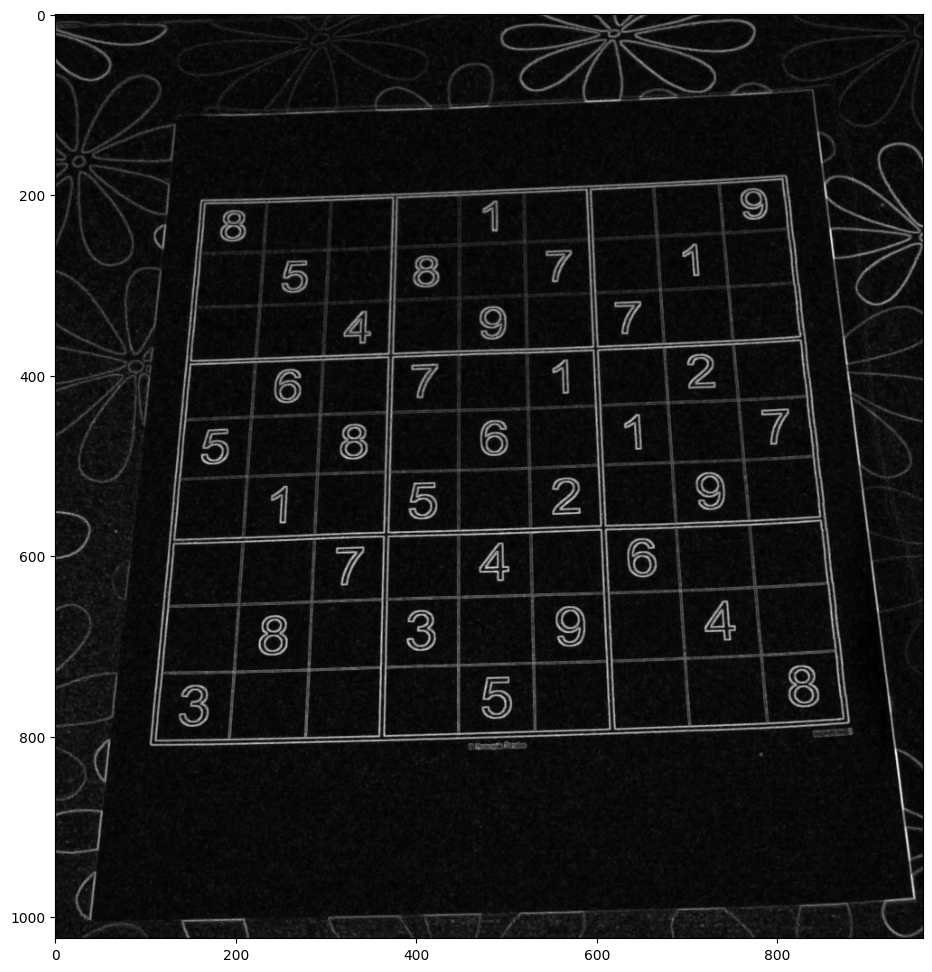

In [90]:
gradient_sudok = cv2.morphologyEx(sudoku, cv2.MORPH_GRADIENT, kernel3)
show_img_gray(gradient_sudok,12)


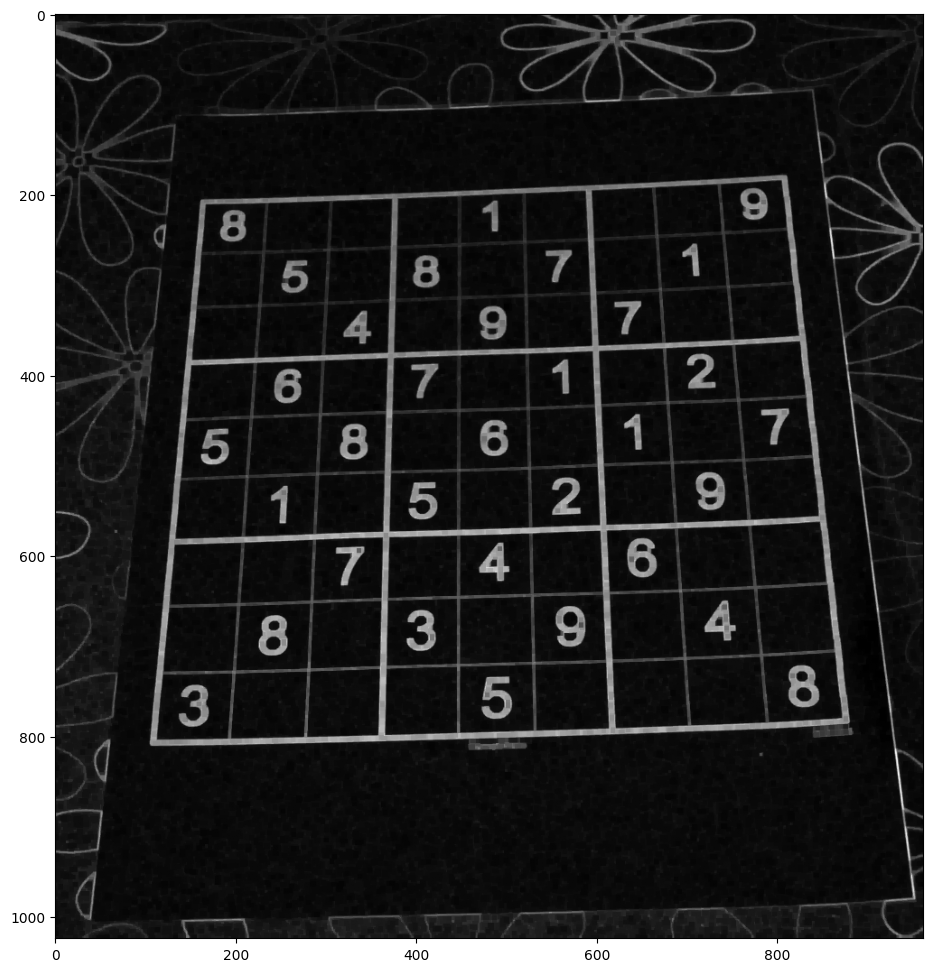

In [91]:
gradient_sudok1 = cv2.morphologyEx(gradient_sudok, cv2.MORPH_CLOSE, kernel)
show_img_gray(gradient_sudok1,12)